# VCT regression model with modular model

In [1]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
%load_ext autoreload
%autoreload 2
#%config Completer.use_jedi = False

In [2]:
import pandas as pd
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)
pd.set_option('display.width', 10000)
import numpy as np
import yaml

from vessel_manoeuvring_models.visualization.plot import track_plot, plot
from phd.visualization.plot_ship import track_plots
from vessel_manoeuvring_models.extended_kalman_vmm import ExtendedKalman, SystemMatrixes
from vmm_abkowitz_diminished import vmm as vmm
from wPCC_pipeline.pipelines.brix.nodes import initial_parameters, extract_added_masses
from wPCC_pipeline.pipelines.preprocess.nodes import load, add_thrust
from wPCC_pipeline.pipelines.filter_data_extended_kalman.nodes import guess_covariance_matrixes, initial_state, extended_kalman_filter, extended_kalman_smoother
from wPCC_pipeline.pipelines.motion_regression.nodes import predict_force, fit_motions, create_model_from_motion_regression
from wPCC_pipeline.pipelines.prediction.nodes import simulate_euler
from phd.pipelines.load_7m.nodes import fix_interpolated_angle
from sklearn.metrics import mean_squared_error
from vessel_manoeuvring_models.models.vmm import VMM, Simulator, ModelSimulator, get_coefficients
import sympy as sp
from functools import reduce
from operator import add
from vessel_manoeuvring_models.symbols import *
import vessel_manoeuvring_models.symbols as symbols
from vessel_manoeuvring_models.models.propeller import *
from vessel_manoeuvring_models.models.semiempirical_rudder import SemiempiricalRudderSystem
from vessel_manoeuvring_models.models.wind_force import WindForceSystem
from IPython.display import display
from vessel_manoeuvring_models.prime_system import df_prime
from vessel_manoeuvring_models.substitute_dynamic_symbols import run, lambdify, get_function_subs
from vessel_manoeuvring_models.models.modular_simulator import ModularVesselSimulator
from vessel_manoeuvring_models.models.subsystem import PrimeEquationSubSystem, EquationSubSystem
from vessel_manoeuvring_models.parameters import df_parameters
from phd.helpers import mean
from vessel_manoeuvring_models.angles import mean_angle
from vessel_manoeuvring_models.angles import smallest_signed_angle
from vessel_manoeuvring_models.models.diff_eq_to_matrix import DiffEqToMatrix
from vessel_manoeuvring_models import prime_system
from vessel_manoeuvring_models.models.modular_simulator import subs_simpler
import statsmodels.api as sm
from wPCC_pipeline.pipelines.vct_data.nodes import vct_scaling
from vct.bokeh_plotting import create_tab

import inspect
from sympy.printing import pretty
p = df_parameters["symbol"]

import logging
log = logging.getLogger(__name__)

import matplotlib.pyplot as plt
plt.style.use('bmh')

Loading BokehJS ...

In [3]:
%reload_kedro
ship='wPCC'
df_VCT = catalog.load(f"{ship}.df_VCT")
ship_data = catalog.load(f"{ship}.ship_data")
df_VCT = vct_scaling(data=df_VCT, ship_data=ship_data)
df_VCT['U'] = df_VCT['V']
thrust_keys = catalog.load(f"params:wPCC.thrust_keys")
exclude_parameters = catalog.load(f"params:{ship}.exclude_parameters")
model_loaders = catalog.load(f"{ship}.models")

df_VCT.sort_values(by=['test type','V','delta','v'], inplace=True)

[07/06/23 14:42:14] INFO     Resolved project path as: /home/maa/dev/PHD.                           ]8;id=201922;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=175961;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#134\134]8;;\
                             To set a different path, run '%reload_kedro <project_root>'                           

[07/06/23 14:42:20] INFO     Kedro project phd                                                      ]8;id=791419;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=434802;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#103\103]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=436590;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=148274;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#104\104]8;;\
                             'pipelines'                                                                           

                    INFO     Registered line magic 'run_viz'                                        ]8;id=503974;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=972853;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/ipython/__init__.py#110\110]8;;\

                    INFO     Loading data from 'wPCC.df_VCT' (CSVDataSet)...                    ]8;id=60527;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=94369;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'wPCC.ship_data' (YAMLDataSet)...                ]8;id=814591;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=997428;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'params:wPCC.thrust_keys' (MemoryDataSet)...     ]8;id=179737;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=870449;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'params:wPCC.exclude_parameters'                 ]8;id=556523;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=607549;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\
                             (MemoryDataSet)...                                                                    

                    INFO     Loading data from 'wPCC.models' (PartitionedDataSet)...            ]8;id=680023;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=910459;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

## Modular model

In [4]:
from vessel_manoeuvring_models.nonlinear_vmm_equations import X_eom, Y_eom, N_eom, fx_eq, fy_eq, mz_eq

In [5]:
#fx_eq = fx_eq.subs(X_D,X_D_)
#fy_eq = fy_eq.subs(Y_D,Y_D_)
#mz_eq = mz_eq.subs(N_D,N_D_)

f_X_H = sp.Function('X_H')(u,v,r,delta)
f_Y_H = sp.Function('Y_H')(u,v,r,delta)
f_N_H = sp.Function('N_H')(u,v,r,delta)

f_X_R = sp.Function('X_R')(u,v,r,delta,thrust)
f_Y_R = sp.Function('Y_R')(u,v,r,delta,thrust)
f_N_R = sp.Function('N_R')(u,v,r,delta,thrust)

f_X_P = sp.Function('X_P')(u,v,r,rev)

eq_X_force = fx_eq.subs(X_D, f_X_H + f_X_R + f_X_P)
eq_Y_force = fy_eq.subs(Y_D, f_Y_H + f_Y_R)
eq_N_force = mz_eq.subs(N_D, f_N_H + f_N_R)

X_eq = X_eom.subs(X_force,eq_X_force.rhs)
Y_eq = Y_eom.subs(Y_force,eq_Y_force.rhs)
N_eq = N_eom.subs(N_force,eq_N_force.rhs)
subs = [
    (p.Xvdot, 0),
    (p.Xrdot, 0),
    (p.Yudot, 0),
    # (p.Yrdot,0),  # this is probably not true
    (p.Nudot, 0),
    # (p.Nvdot,0),# this is probably not true
]
X_eq=X_eq.subs(subs)
Y_eq=Y_eq.subs(subs)
N_eq=N_eq.subs(subs)

display(X_eq)
display(Y_eq)
display(N_eq)

Eq(m*(\dot{u} - r**2*x_G - r*v), X_{\dot{u}}*\dot{u} + X_H(u, v, r, delta) + X_P(u, v, r, rev) + X_R(u, v, r, delta, thrust))

Eq(m*(\dot{r}*x_G + \dot{v} + r*u), Y_{\dot{r}}*\dot{r} + Y_{\dot{v}}*\dot{v} + Y_H(u, v, r, delta) + Y_R(u, v, r, delta, thrust))

Eq(I_z*\dot{r} + m*x_G*(\dot{v} + r*u), N_{\dot{r}}*\dot{r} + N_{\dot{v}}*\dot{v} + N_H(u, v, r, delta) + N_R(u, v, r, delta, thrust))

In [6]:
parameters = {}

params = {'C0_w_p0': 0.10378571428571445,
 'C1_w_p0': 0.24690520231438584,
 'k_0': 0.576581716472807,
 'k_1': -0.3683675998138215,
 'k_2': -0.07542975438913463}
parameters.update(params)
g_=9.81
parameters['g'] = g_

rudder_particulars = {
'x_R'   : ship_data['x_r'],
'y_R'   : 0,
'z_R'   : 0,
'A_R'   : 70/(ship_data['scale_factor']**2),
'b_R'   : 7.18/ship_data['scale_factor'],
'n_prop':ship_data['n_prop'],
'w_f'   :ship_data['w_p0'],
}

prop_data = {
'r_0': ship_data['D']/2,
'x': 0.10,  # Guessing...
}

rudder_parameters = {
"C_L_tune" : 1.0,
#"delta_lim": np.deg2rad(40),
"delta_lim": 2*0.6981317007977318,
"kappa": 1.0, # (Small value means much flow straightening)
"nu":1.18849E-06,
}
parameters.update(rudder_parameters)
parameters['Xthrust'] = 1 - ship_data['tdf']
ship_parameters = ship_data.copy()
ship_parameters.update(rudder_particulars)
ship_parameters.update(prop_data)

In [797]:
rudder_particulars

{'x_R': -2.42219908951329,
 'y_R': 0,
 'z_R': 0,
 'A_R': 0.041238571024601746,
 'b_R': 0.17427184466019416,
 'n_prop': 2,
 'w_f': 0.151}

### Calculate added masses

In [7]:
mask = df_parameters['state']=='dot'
lambdas_added_mass = df_parameters.loc[mask,"brix_lambda"].dropna()
added_masses = {key:run(lambda_, **ship_data) for key,lambda_ in lambdas_added_mass.items()}
parameters.update(added_masses)

## Added mass nondim check

In [782]:
ship_data

{'T': 0.2063106796116504,
 'L': 5.014563106796117,
 'CB': 0.45034232324249973,
 'B': 0.9466019417475728,
 'rho': 1000,
 'x_G': 0,
 'm': 441.0267843660858,
 'I_z': 693.124396594905,
 'volume': 0.4410267843660858,
 'scale_factor': 41.2,
 'x_r': -2.42219908951329,
 'TWIN': 1,
 'x_p': -2.42219908951329,
 'D': 0.12135922330097086,
 'w_p0': 0.151,
 'n_prop': 2,
 'tdf': 0.117,
 'A_XV': 0.5938354227542653,
 'A_YV': 3.2008789706852667,
 'rho_A': 1.225}

In [783]:
ship_data2x = ship_data.copy()
alpha = 2
ship_data2x['T']*=alpha
ship_data2x['L']*=alpha
ship_data2x['B']*=alpha
ship_data2x['x_G']*=alpha
ship_data2x['m']*=alpha**3
ship_data2x['I_z']*=alpha**5
ship_data2x['volume']*=alpha**3

In [791]:
added_masses_wPCC = {key:run(lambda_, **ship_data) for key,lambda_ in lambdas_added_mass.items()}
added_masses_2x = {key:run(lambda_, **ship_data2x) for key,lambda_ in lambdas_added_mass.items()}
assert added_masses_wPCC==added_masses_2x

In [787]:
added_masses_7m 

{'Xudot': 0.00017880704448812042,
 'Yvdot': -0.006109387408263365,
 'Yrdot': -0.00030313777458141895,
 'Nvdot': -0.00012825440172375716,
 'Nrdot': -0.00029867482773178765}

In [792]:
model = ModularVesselSimulator(X_eq=X_eq, Y_eq=Y_eq, N_eq=N_eq, 
                               ship_parameters=ship_parameters, 
                               parameters=parameters, 
                               control_keys=['delta','rev'], do_create_jacobian=False)

In [794]:
 ModularVesselSimulator(X_eq=X_eq, Y_eq=Y_eq, N_eq=N_eq, 
                               ship_parameters={}, 
                               parameters={}, 
                               control_keys=[], do_create_jacobian=False)


 X_eq: 
   /           2          \                                                                                                                                                               
m*\\dot{u} - r *x_G - r*v/ = X_{\dot{u}}*\dot{u} + X_H(u, v, r, delta) + X_P(u, v, r, rev) + X_R(u, v, r, delta, thrust) + X_W(C_x4, rho_A, C_x5, A_XV, C_x3, awa, C_x1, aws, C_x2, C_x0) 

 Y: 
 m*(\dot{r}*x_G + \dot{v} + r*u) = Y_{\dot{r}}*\dot{r} + Y_{\dot{v}}*\dot{v} + Y_H(u, v, r, delta) + Y_R(u, v, r, delta, thrust) + Y_W(C_y2, C_y3, rho_A, aws, awa, C_y1, A_YV) 

 N: 
 I_z*\dot{r} + m*x_G*(\dot{v} + r*u) = N_{\dot{r}}*\dot{r} + N_{\dot{v}}*\dot{v} + N_H(u, v, r, delta) + N_R(u, v, r, delta, thrust) + N_W(L, rho_A, aws, C_n1, awa, C_n3, C_n2, A_YV) 

## VCT data

In [9]:
create_tab(df_VCT=df_VCT, ys=['fx_hull','fy_hull','mz_hull'])

Tabs(id='3728', ...)

In [10]:
units = {
'fx_hull':'force',
'fy_hull':'force',
'mz_hull':'moment',
}

df_VCT_u0 = df_VCT.copy()
V0_ = df_VCT['V'].min()
#V0_=0
df_VCT_u0['u']-=V0_

df_VCT_prime = model.prime_system.prime(df_VCT_u0[['u','v','r','fx_hull','fy_hull','mz_hull','test type']], U=df_VCT['U'], units=units)
df_VCT_prime['X_H'] = df_VCT_prime['fx_hull']
df_VCT_prime['Y_H'] = df_VCT_prime['fy_hull']
df_VCT_prime['N_H'] = df_VCT_prime['mz_hull']


In [11]:
V0_

0.4007029382076784

## Hull force model

In [12]:
eq_X_H = sp.Eq(X_H, p.X0 + p.Xu*u + p.Xvv*v**2 + p.Xrr*r**2 +p.Xvr*v*r)
eq_X_H

Eq(X_H, X_{0} + X_{rr}*r**2 + X_{u}*u + X_{vr}*r*v + X_{vv}*v**2)

In [700]:
#eq_Y_H = sp.Eq(Y_H, 
#               #p.Y0+
#               +p.Yv*v 
#               +p.Yvv*v*sp.Abs(v) 
#               #+p.Yr*r 
#               +p.Yvrr*v*r**2
#              )

eq_Y_H = sp.Eq(Y_H, 
               #p.Y0+
               +p.Yv*v 
               +p.Yvvv*v**3 
               #+p.Yr*r 
               +p.Yvrr*v*r**2
              )

eq_Y_H

Eq(Y_H, Y_{vrr}*r**2*v + Y_{vvv}*v**3 + Y_{v}*v)

In [701]:
#eq_N_H = sp.Eq(N_H, 
#               #p.N0
#               +p.Nv*v 
#               +p.Nvv*v*sp.Abs(v) 
#               +p.Nr*r
#               +p.Nrr*r*sp.Abs(r)
#               +p.Nvvr*v**2*r
#              )

eq_N_H = sp.Eq(N_H, 
               #p.N0
               +p.Nv*v 
               +p.Nvvv*v**3 
               +p.Nr*r
               +p.Nrrr*r**3
               +p.Nvvr*v**2*r
              )

eq_N_H

Eq(N_H, N_{rrr}*r**3 + N_{r}*r + N_{vvr}*r*v**2 + N_{vvv}*v**3 + N_{v}*v)

In [702]:
equations_hull = [eq_X_H, eq_Y_H, eq_N_H]
hull = PrimeEquationSubSystem(ship=model, equations=equations_hull, create_jacobians=False, V0=V0_)

model.subsystems['hull'] = hull

In [703]:
exclude_parameters={}

eq_to_matrix_X_H = DiffEqToMatrix(hull.equations['X_H'], label=X_H, base_features=[u,v,r,thrust], exclude_parameters=exclude_parameters)
eq_to_matrix_Y_H = DiffEqToMatrix(hull.equations['Y_H'], label=Y_H, base_features=[u,v,r,thrust], exclude_parameters=exclude_parameters)
eq_to_matrix_N_H = DiffEqToMatrix(hull.equations['N_H'], label=N_H, base_features=[u,v,r,thrust], exclude_parameters=exclude_parameters)


In [704]:
tests = df_VCT_prime.groupby(by='test type')

regression_pipeline = {

    'resistance': {
        'eq': hull.equations['X_H'].subs([
        (v,0),
        (r,0),
        ]),
        'data':tests.get_group('resistance'),
    },
    
    'Drift angle fx': {
        'eq': hull.equations['X_H'].subs([
        (r,0),
        ]),
        'data':tests.get_group('Drift angle'),
    },
    
    'Drift angle fy': {
        'eq': hull.equations['Y_H'].subs([
        (r,0),
        ]),
        'data':tests.get_group('Drift angle'),
    },
    
    'Drift angle mz': {
        'eq': hull.equations['N_H'].subs([
        (r,0),
        ]),
        'data':tests.get_group('Drift angle'),
    },
    
    'Circle fx': {
        'eq': hull.equations['X_H'].subs([
        (v,0),
        ]),
        'data':tests.get_group('Circle'),
    },
    
    'Circle fy': {
        'eq': hull.equations['Y_H'].subs([
        (v,0),
        ]),
        'data':tests.get_group('Circle'),
    },
    
    'Circle mz': {
        'eq': hull.equations['N_H'].subs([
        (v,0),
        ]),
        'data':tests.get_group('Circle'),
    },
    
    
    'Circle + Drift fx': {
        'eq': hull.equations['X_H'],
        'data':tests.get_group('Circle + Drift'),
    },
    
    'Circle + Drift fy': {
        'eq': hull.equations['Y_H'],
        'data':tests.get_group('Circle + Drift'),
    },
    
    'Circle + Drift mz': {
        'eq': hull.equations['N_H'],
        'data':tests.get_group('Circle + Drift'),
    },
    

}

In [705]:
regression_pipeline['resistance']['eq']

Eq(X_H, X_{0} + X_{u}*u)

<Axes: xlabel='u'>

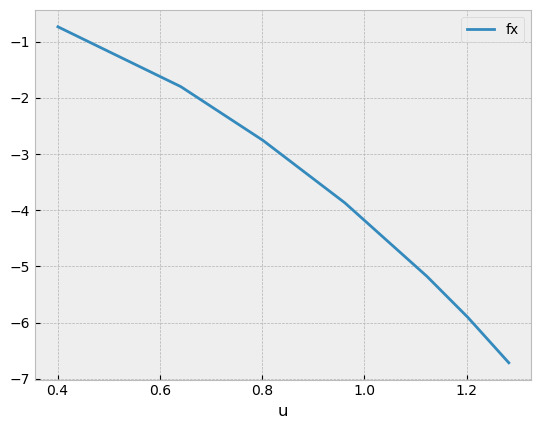

In [706]:
df_VCT.groupby(by='test type', sort=False).get_group('resistance').plot(x='u', y='fx')

<Axes: xlabel='u'>

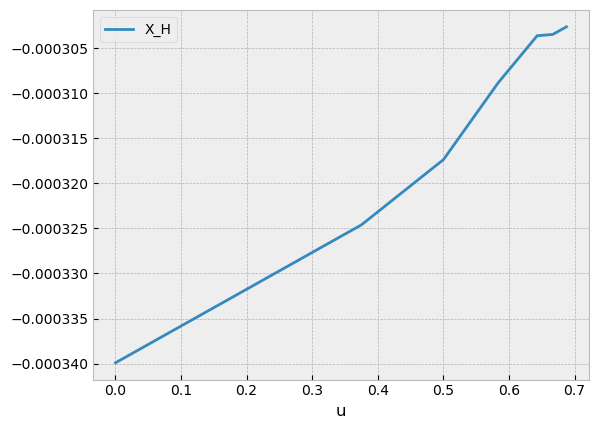

In [707]:
regression_pipeline['resistance']['data'].plot(x='u',y='X_H')

In [708]:
df_VCT_prime['test type'].unique()

array(['Circle', 'Circle + Drift', 'Drift angle',
       'Rudder and drift angle', 'Rudder angle resistance (no propeller)',
       'resistance'], dtype=object)

In [709]:
mask = df_VCT_prime['test type'].isin(['resistance',
                                       'Drift angle', 
                                       'Circle', 
                                       'Circle + Drift'])
data_prime = df_VCT_prime.loc[mask].copy()

In [710]:
models = {}
exclude_parameters={}
new_parameters = {}
for name, regression in regression_pipeline.items():
    eq = regression['eq']
    if eq.rhs == 0:
        print(f'skipping:{name}')
        continue 
    
    label = regression.get('label',eq.lhs)
    eq_to_matrix = DiffEqToMatrix(eq, label=label, base_features=[u,v,r,thrust], exclude_parameters=exclude_parameters)
        
    data = regression['data']
    assert len(data) > 0
    key = eq_to_matrix.acceleration_equation.lhs.name
    X,y = eq_to_matrix.calculate_features_and_label(data=data, y=data[key])
    
    if len(X.columns)==0:
        print(f'skipping:{name}')
        continue
    
    ols = sm.OLS(y,X)
    models[name] = ols_fit = ols.fit()
    new_parameters.update(ols_fit.params)
    exclude_parameters.update(new_parameters)

skipping:Circle fy


In [711]:
self=eq_to_matrix

self.y_ = sp.symbols("y")

## Extract the coefficients (based on the base features)
subs = [(feature, 1) for feature in self.base_features]
parts = self.acceleration_equation.rhs.subs(subs)

if isinstance(parts, sp.Symbol):
    coefficients = [parts]
else:
    coefficients = [coeff for coeff in parts.args]
#check_coefficients(coefficients)

## Find the feature expression that is associated with each coefficient,
# and put it in a list: columns
subs = {coeff: 0 for coeff in coefficients}
columns = []
for coeff in coefficients:
    subs_mask = subs.copy()
    subs_mask[coeff] = 1
    columns.append(self.acceleration_equation.rhs.subs(subs_mask))

## Feature matrix
self.X_matrix = sp.Matrix(columns).T

## Put this into some equations:
self.beta_ = sp.MatrixSymbol("beta", len(columns), 1)
self.eq_beta = sp.Eq(self.beta_, sp.Matrix(coefficients))

self.X_ = sp.MatrixSymbol("X", 1, len(columns))
self.eq_X = sp.Eq(self.X_, self.X_matrix)
self.eq_y = sp.Eq(self.y_, self.label)

In [712]:
type(parts)

sympy.core.add.Add

In [713]:
coefficients

[N_{rrr}, N_{r}, N_{vvr}, N_{vvv}, N_{v}]

In [714]:
self.eq_X

Eq(X, Matrix([[r**3, r, r*v**2, v**3, v]]))

In [715]:
for key,fit in models.items():
    display(fit.summary())

[07/06/23 15:16:30] WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=250081;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=308693;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 7 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    X_H   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     154.3
Date:                Thu, 06 Jul 2023   Prob (F-statistic):           5.99e-05
Time:                        15:16:30   Log-Likelihood:                 80.985
No. Observations:                   7   AIC:                            -158.0
Df Residuals:                       5   BIC:                            -158.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
X0            -0.0003   2.46e-06   -138.941      0.000      -0.000      -0.000
Xu          5.638e-05   4.54e-06     12.423      0.000    4.47e-05     6.8e-05
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   1.467
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.955
Skew:                          -0.682   Prob(JB):                        0.620
Kurtosis:                       1.811   Cond. No.                         5.56
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    X_H   R-squared (uncentered):                   0.973
Model:                            OLS   Adj. R-squared (uncentered):              0.970
Method:                 Least Squares   F-statistic:                              321.3
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    2.38e-08
Time:                        15:16:30   Log-Likelihood:                          110.22
No. Observations:                  10   AIC:                                     -218.4
Df Residuals:                       9   BIC:                                     -218.1
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Xvv           -0.0013   7.47e-05    -17.925      0.000      -0.002      -0.001
==============================================================================
Omnibus:                        1.455   Durbin-Watson:                   1.517
Prob(Omnibus):                  0.483   Jarque-Bera (JB):                0.441
Skew:                           0.513   Prob(JB):                        0.802
Kurtosis:                       2.930   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    Y_H   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          3.376e+04
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    1.97e-16
Time:                        15:16:30   Log-Likelihood:                          103.05
No. Observations:                  10   AIC:                                     -202.1
Df Residuals:                       8   BIC:                                     -201.5
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Yvvv          -0.1264      0.003    -49.742      0.000      -0.132      -0.121
Yv            -0.0034    6.5e-05    -51.860      0.000      -0.004      -0.003
==============================================================================
Omnibus:                        7.125   Durbin-Watson:                   1.871
Prob(Omnibus):                  0.028   Jarque-Bera (JB):                3.207
Skew:                          -1.363   Prob(JB):                        0.201
Kurtosis:                       3.518   Cond. No.                         102.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    N_H   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                              8889.
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    4.09e-14
Time:                        15:16:30   Log-Likelihood:                          103.47
No. Observations:                  10   AIC:                                     -202.9
Df Residuals:                       8   BIC:                                     -202.3
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Nvvv          -0.0246      0.002    -10.100      0.000      -0.030      -0.019
Nv            -0.0026   6.23e-05    -41.655      0.000      -0.003      -0.002
==============================================================================
Omnibus:                        2.183   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.336   Jarque-Bera (JB):                0.924
Skew:                          -0.251   Prob(JB):                        0.630
Kurtosis:                       1.598   Cond. No.                         102.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

                    WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=255546;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=628740;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 6 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    X_H   R-squared (uncentered):                   0.980
Model:                            OLS   Adj. R-squared (uncentered):              0.976
Method:                 Least Squares   F-statistic:                              242.1
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    1.99e-05
Time:                        15:16:30   Log-Likelihood:                          65.912
No. Observations:                   6   AIC:                                     -129.8
Df Residuals:                       5   BIC:                                     -130.0
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Xrr           -0.0004   2.28e-05    -15.561      0.000      -0.000      -0.000
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   0.785
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.461
Skew:                          -0.139   Prob(JB):                        0.794
Kurtosis:                       1.672   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

                    WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=967872;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=510261;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 6 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    N_H   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                              7170.
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    7.78e-08
Time:                        15:16:30   Log-Likelihood:                          65.326
No. Observations:                   6   AIC:                                     -126.7
Df Residuals:                       4   BIC:                                     -127.1
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Nrrr          -0.0026      0.000     -8.646      0.001      -0.003      -0.002
Nr            -0.0008   3.07e-05    -26.104      0.000      -0.001      -0.001
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   0.668
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.987
Skew:                           0.656   Prob(JB):                        0.610
Kurtosis:                       1.508   Cond. No.                         34.0
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

                    WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=719950;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=537912;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 4 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    X_H   R-squared (uncentered):                   0.998
Model:                            OLS   Adj. R-squared (uncentered):              0.997
Method:                 Least Squares   F-statistic:                              1229.
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    5.11e-05
Time:                        15:16:30   Log-Likelihood:                          46.678
No. Observations:                   4   AIC:                                     -91.36
Df Residuals:                       3   BIC:                                     -91.97
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Xvr           -0.0030   8.54e-05    -35.052      0.000      -0.003      -0.003
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   2.121
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.325
Skew:                           0.508   Prob(JB):                        0.850
Kurtosis:                       2.041   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

                    WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=213263;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=255149;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 4 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    Y_H   R-squared (uncentered):                   0.982
Model:                            OLS   Adj. R-squared (uncentered):              0.975
Method:                 Least Squares   F-statistic:                              159.6
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                     0.00107
Time:                        15:16:30   Log-Likelihood:                          36.772
No. Observations:                   4   AIC:                                     -71.54
Df Residuals:                       3   BIC:                                     -72.16
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Yvrr          -0.0700      0.006    -12.635      0.001      -0.088      -0.052
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   0.642
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.522
Skew:                          -0.025   Prob(JB):                        0.770
Kurtosis:                       1.230   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

                    WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=802495;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=303000;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 4 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                    N_H   R-squared (uncentered):                   0.986
Model:                            OLS   Adj. R-squared (uncentered):              0.982
Method:                 Least Squares   F-statistic:                              213.7
Date:                Thu, 06 Jul 2023   Prob (F-statistic):                    0.000694
Time:                        15:16:30   Log-Likelihood:                          39.576
No. Observations:                   4   AIC:                                     -77.15
Df Residuals:                       3   BIC:                                     -77.77
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Nvvr          -0.0775      0.005    -14.617      0.001      -0.094      -0.061
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   1.047
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.312
Skew:                          -0.026   Prob(JB):                        0.856
Kurtosis:                       1.633   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [716]:
new_parameters

{'X0': -0.00034219201933258957,
 'Xu': 5.638005382365671e-05,
 'Xvv': -0.0013391376150706925,
 'Yvvv': -0.12641371651391264,
 'Yv': -0.003372666554617324,
 'Nvvv': -0.024604169399312037,
 'Nv': -0.0025966465494148064,
 'Xrr': -0.00035470521519139663,
 'Nrrr': -0.002572123992950829,
 'Nr': -0.0008006896191474081,
 'Xvr': -0.0029936162915255022,
 'Yvrr': -0.06995629388360704,
 'Nvvr': -0.07745931644358173}

In [717]:
model.parameters.update(new_parameters)

In [718]:
states = df_VCT[['u', 'v', 'r']]
#states = df_VCT_u0[['u', 'v', 'r', 'U']]

control = df_VCT[['delta','rev']]
df_predicted_hull_forces = pd.DataFrame(hull.calculate_forces(states_dict=states, control=control, calculation={}))

In [719]:
df_prediction = df_VCT.copy()
df_prediction['model_name'] = 'Prediction'
df_prediction['fx_hull'] = df_predicted_hull_forces['X_H']
df_prediction['fy_hull'] = df_predicted_hull_forces['Y_H']
df_prediction['mz_hull'] = df_predicted_hull_forces['N_H']
results = pd.concat((df_VCT, df_prediction), axis=0)

In [720]:
create_tab(df_VCT=results, ys=['fx_hull','fy_hull','mz_hull'])

Tabs(id='109578', ...)

## Add thrust prediction model

In [721]:
C0_w_p0,C1_w_p0,F_n = sp.symbols("C0_w_p0, C1_w_p0,F_n")
eq_w_p0 = sp.Eq(w_p0, C0_w_p0 + C1_w_p0*F_n)
eq_w_p0

Eq(w_p0, C0_w_p0 + C1_w_p0*F_n)

In [722]:
eq_F_n = sp.Eq(F_n,U/sp.sqrt(L*g))
eq_F_n

Eq(F_n, U/sqrt(L*g))

In [723]:
eq_w_p0 = eq_w_p0.subs(F_n, eq_F_n.rhs)
eq_w_p0

Eq(w_p0, C0_w_p0 + C1_w_p0*U/sqrt(L*g))

Assuming that $w_{p0}$ is a good model:

In [724]:
eq_w_p = eq_w_p0.subs(w_p0,w_p)
eq_w_p

Eq(w_p, C0_w_p0 + C1_w_p0*U/sqrt(L*g))

In [725]:
eqs = [eq_T,eq_K_T, eq_J, eq_w_p]
solution = sp.solve(eqs, thrust_propeller, K_T, J, w_p, dict=True)
eq = sp.Eq(thrust,n_prop*solution[0][thrust_propeller])
eq

Eq(thrust, D**2*n_prop*rho*(C0_w_p0**2*L*g*k_2*u**2 + 2*C0_w_p0*C1_w_p0*U*k_2*u**2*sqrt(L*g) - C0_w_p0*D*L*g*k_1*rev*u - 2*C0_w_p0*L*g*k_2*u**2 + C1_w_p0**2*U**2*k_2*u**2 - C1_w_p0*D*U*k_1*rev*u*sqrt(L*g) - 2*C1_w_p0*U*k_2*u**2*sqrt(L*g) + D**2*L*g*k_0*rev**2 + D*L*g*k_1*rev*u + L*g*k_2*u**2)/(L*g))

In [726]:
eq_X_P = sp.Eq(X_P, p.Xthrust*thrust)

In [727]:
propeller_equations = [eq, eq_X_P]
propellers = EquationSubSystem(ship=model, equations=propeller_equations, create_jacobians=False)
model.subsystems['propellers'] = propellers

## Add semi-empirical rudder

In [728]:
rudders = SemiempiricalRudderSystem(ship=model, create_jacobians=False)
model.subsystems['rudders'] = rudders

In [729]:
model.subsystems

{'hull': <vessel_manoeuvring_models.models.subsystem.PrimeEquationSubSystem at 0x7fc2fa87d1b0>,
 'propellers': <vessel_manoeuvring_models.models.subsystem.EquationSubSystem at 0x7fc2fc6f6890>,
 'rudders': <vessel_manoeuvring_models.models.semiempirical_rudder.SemiempiricalRudderSystem at 0x7fc2f7cf5d20>}

## Simulate

## Correct the resistance

In [730]:
time_series_meta_data = catalog.load(f"{ship}.time_series_meta_data")
time_series_meta_data.index = time_series_meta_data.index.astype(str)
time_series_meta_data.rename(columns={'test_type':'test type'}, inplace=True)
time_series_smooth = catalog.load(f"{ship}.time_series_preprocessed.ek_smooth")

_ = []
for id, row in time_series_meta_data.groupby(by=['test type']).get_group('reference speed').iterrows():
    try:
        data_ = time_series_smooth[f'wpcc.updated.{id}.ek_smooth']()
    except:
        continue
    
    data_['V'] = data_['U'] = np.sqrt(data_['u']**2 + data_['v']**2)
    data_['rev'] = data_[['Prop/SB/Rpm', 'Prop/PS/Rpm']].mean(axis=1)
    _.append(pd.Series(data_.mean(), name=id))
    
df_reference_speed = pd.concat(_,axis=1).transpose()

[07/06/23 15:16:41] INFO     Loading data from 'wPCC.time_series_meta_data' (CSVDataSet)...     ]8;id=943443;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=720752;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'wPCC.time_series_preprocessed.ek_smooth'        ]8;id=336821;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=769496;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\
                             (PartitionedDataSet)...                                                               

<Axes: xlabel='u'>

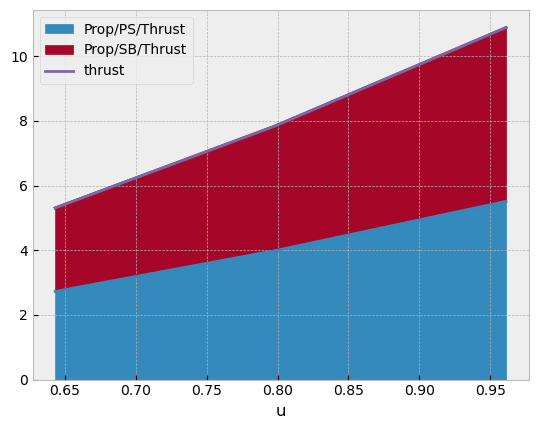

In [731]:
fig,ax=plt.subplots()
df_reference_speed.plot.area(x='u', y=[r'Prop/PS/Thrust',r'Prop/SB/Thrust'], ax=ax)
df_reference_speed.plot(x='u', y='thrust', ax=ax)


<Axes: xlabel='u'>

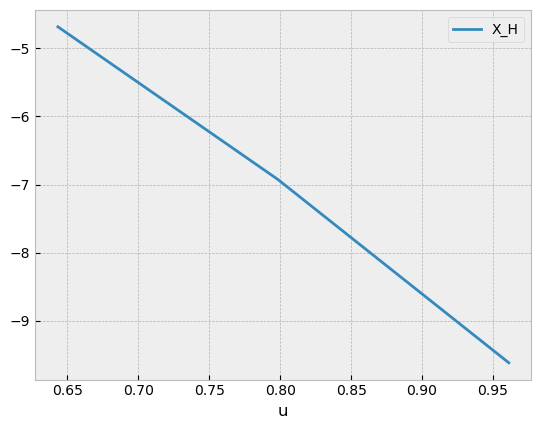

In [732]:
df_reference_speed['X_H'] = -(1-ship_data['tdf'])*df_reference_speed['thrust']
df_reference_speed.plot(x='u', y='X_H')

In [733]:
df_reference_speed_u = df_reference_speed.copy()
df_reference_speed_u['u']-=V0_
df_reference_speed_u_prime = model.prime_system.prime(df_reference_speed_u[['u','v','r','X_H']], U=df_reference_speed_u['V'])

In [734]:
V0_

0.4007029382076784

In [735]:
df_reference_speed['V']

22639    0.643263
22635    0.798263
22611    0.961111
Name: V, dtype: float64

<Axes: xlabel='u'>

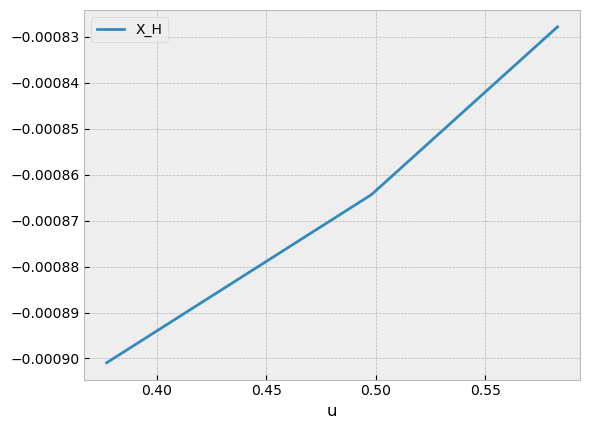

In [736]:
df_reference_speed_u_prime.plot(x='u', y='X_H')

In [737]:
regression = regression_pipeline['resistance']
eq = regression['eq']

label = regression.get('label',eq.lhs)
eq_to_matrix = DiffEqToMatrix(eq, label=label, base_features=[u,v,r,thrust], exclude_parameters={})
    
data_ = df_reference_speed_u_prime
assert len(data_) > 0
key = eq_to_matrix.acceleration_equation.lhs.name
X,y = eq_to_matrix.calculate_features_and_label(data=data_, y=data_[key])

ols = sm.OLS(y,X)
ols_fit = ols.fit()
model2 = model.copy()
model2.parameters.update(ols_fit.params)
#exclude_parameters.update(new_parameters)

In [738]:
ols_fit.summary()

[07/06/23 15:16:42] WARNING  /home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/statsmodels/ ]8;id=589179;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py\warnings.py]8;;\:]8;id=607080;file:///home/maa/anaconda3/envs/phd/lib/python3.10/warnings.py#109\109]8;;\
                             stats/stattools.py:74: ValueWarning: omni_normtest is not valid with                  
                             less than 8 observations; 3 samples were given.                                       
                               warn("omni_normtest is not valid with less than 8 observations; %i "                
                                                                                                                   

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    X_H   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     99.56
Date:                Thu, 06 Jul 2023   Prob (F-statistic):             0.0636
Time:                        15:16:42   Log-Likelihood:                 33.918
No. Observations:                   3   AIC:                            -63.84
Df Residuals:                       1   BIC:                            -65.64
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
X0            -0.0010   1.74e-05    -59.596      0.011      -0.001      -0.001
Xu             0.0004   3.52e-05      9.978      0.064    -9.6e-05       0.001
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   2.980
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.509
Skew:                          -0.675   Prob(JB):                        0.775
Kurtosis:                       1.500   Cond. No.                         14.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [739]:
id = df_reference_speed.sort_values(by='u', ascending=False).index[0]
data = time_series_smooth[f'wpcc.updated.{id}.ek_smooth']()

#data = time_series_smooth['wpcc.updated.22774.ek_smooth']()
data['V'] = data['U'] = np.sqrt(data['u']**2 + data['v']**2)
data['rev'] = data[['Prop/SB/Rpm', 'Prop/PS/Rpm']].mean(axis=1)

In [740]:
result = model.simulate(data)

In [741]:

#resistance_factor = 2.5
#model2.parameters['X0']*=resistance_factor
#model2.parameters['Xu']*=resistance_factor
#model2.parameters['Xuu']*=resistance_factor
if 'Xuu' in model2.parameters:
    model2.parameters.pop('Xuu')
result2 = model2.simulate(data)

In [742]:
def force_predicted(model, data):
    df_force_predicted = pd.DataFrame(model.calculate_forces(data[model.states_str], control=data[model.control_keys]))
    
    df_force_predicted['fx'] = run(model.lambda_X_D, inputs=df_force_predicted)
    df_force_predicted['fy'] = run(model.lambda_Y_D, inputs=df_force_predicted)
    df_force_predicted['mz'] = run(model.lambda_N_D, inputs=df_force_predicted)
    
    return df_force_predicted

## Total force

In [743]:
def plot_total_force(model, data):
    
    df_force_predicted = force_predicted(model=model, data=data)
    df_force = model.forces_from_motions(data=data)
    
    #fig,ax=plt.subplots()
    #data.plot(y='delta',ax=ax)
    
    fig,ax=plt.subplots()
    fig.suptitle('X force')
    window=100
    df_force.rolling(window=window).mean().plot(y='fx', label='Experiment', ax=ax)
    df_force_predicted.rolling(window=window).mean().plot(y='fx', label='Prediction', ax=ax)
    
    fig,ax=plt.subplots()
    fig.suptitle('Y force')
    
    df_force.rolling(window=window).mean().plot(y='fy', label='Experiment', ax=ax)
    df_force_predicted.rolling(window=window).mean().plot(y='fy', label='Prediction', ax=ax)
    
    fig,ax=plt.subplots()
    fig.suptitle('N Moment')
    
    df_force.rolling(window=window).mean().plot(y='mz', label='Experiment', ax=ax)
    df_force_predicted.rolling(window=window).mean().plot(y='mz', label='Prediction', ax=ax)

## Force components

In [744]:
def plot_force_components(model, data):
    
    df_force_predicted = force_predicted(model=model, data=data)
    
    keys = list(get_function_subs(model.X_D_eq).values())
    fig,ax=plt.subplots()
    fig.suptitle('X forces')
    
    for key in keys:
        window=10
        df_force_predicted.rolling(window=window).mean().plot(y=key, ax=ax)
        ax.set_xlabel('time [s]')
        
    keys = list(get_function_subs(model2.Y_D_eq).values())
    fig,ax=plt.subplots()
    fig.suptitle('Y forces')
    
    for key in keys:
        window=10
        df_force_predicted.rolling(window=window).mean().plot(y=key, ax=ax)
        ax.set_xlabel('time [s]')
        
    keys = list(get_function_subs(model2.N_D_eq).values())
    fig,ax=plt.subplots()
    fig.suptitle('N moments')
    
    for key in keys:
        window=10
        df_force_predicted.rolling(window=window).mean().plot(y=key, ax=ax)
        ax.set_xlabel('time [s]')
    
    

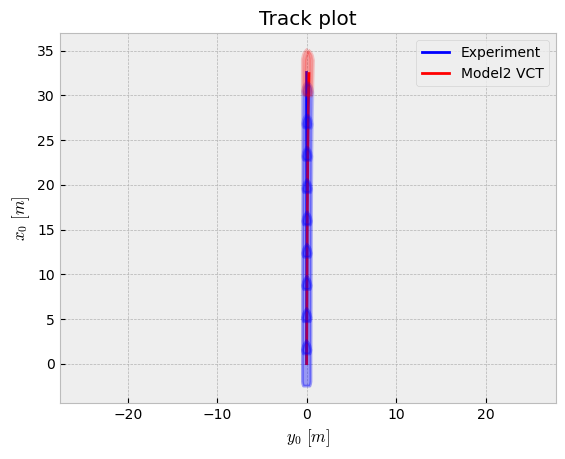

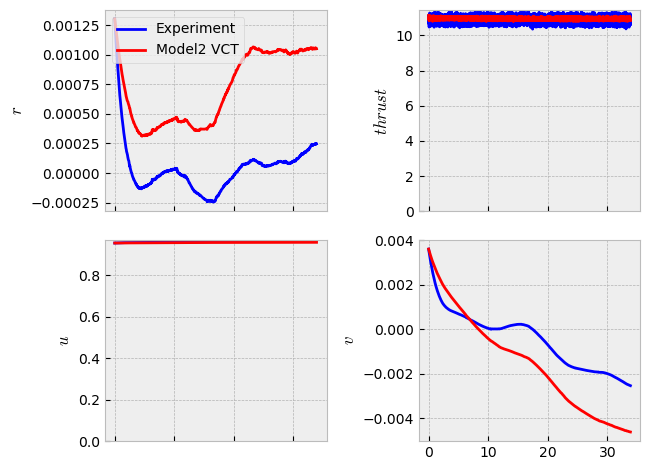

In [745]:
dataframes = {
              'Experiment':data,
              #'Model VCT':result,
              'Model2 VCT':result2,
             }
ax = track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B'], N=10)
plot(dataframes, keys=['u','v','r','thrust']);

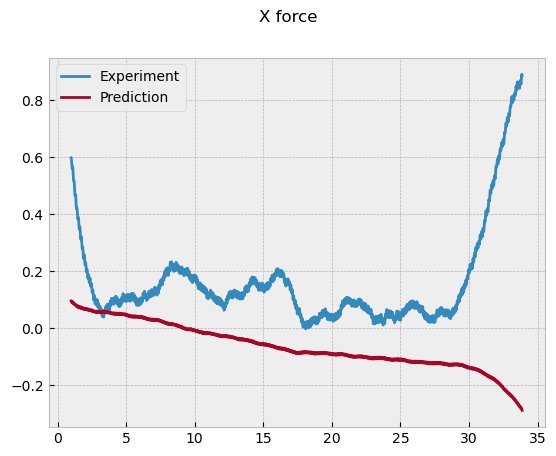

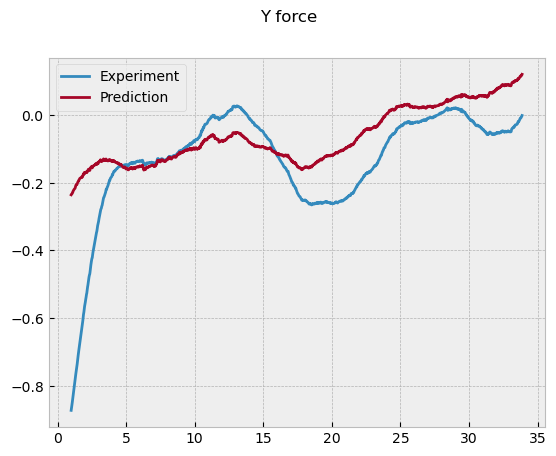

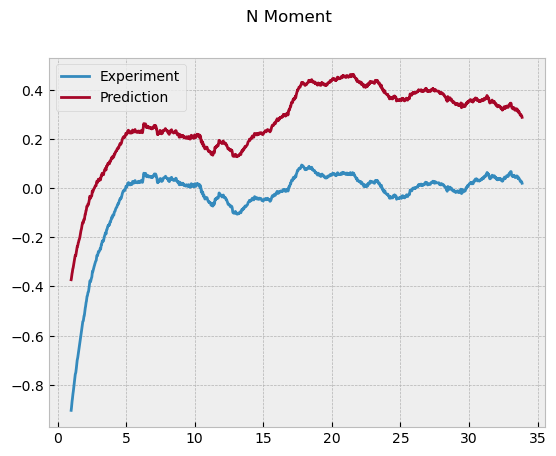

In [746]:
plot_total_force(model=model2, data=data)

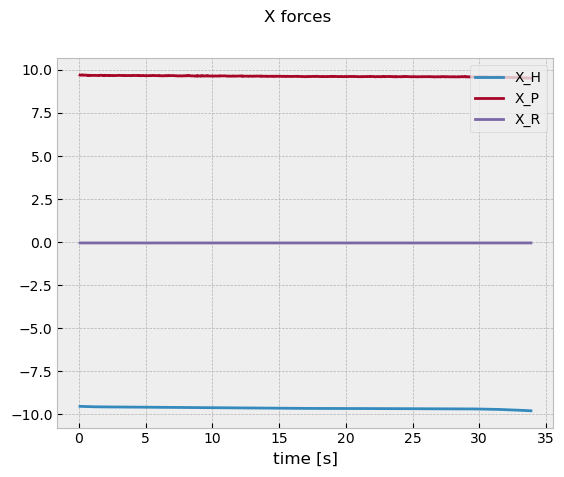

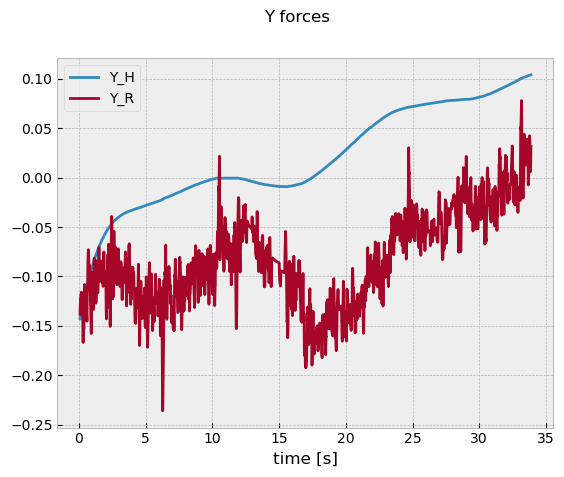

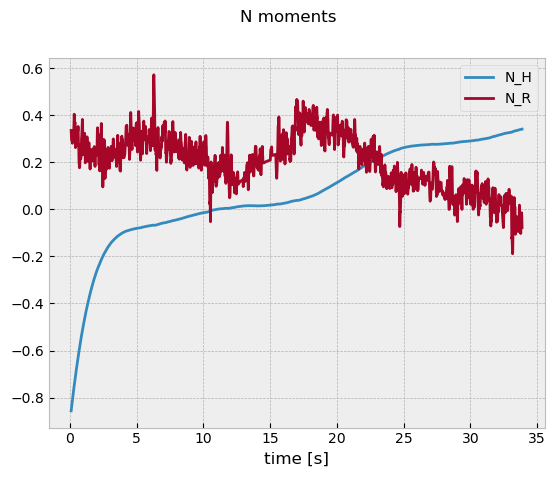

In [747]:
plot_force_components(model=model2, data=data)

In [748]:
time_series_smooth = catalog.load(f"{ship}.time_series_preprocessed.ek_smooth")

id = 22773
data = time_series_smooth[f'wpcc.updated.{id}.ek_smooth']()
data['V'] = data['U'] = np.sqrt(data['u']**2 + data['v']**2)
data['rev'] = data[['Prop/SB/Rpm', 'Prop/PS/Rpm']].mean(axis=1)

[07/06/23 15:16:58] INFO     Loading data from 'wPCC.time_series_preprocessed.ek_smooth'        ]8;id=482682;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=145455;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\
                             (PartitionedDataSet)...                                                               

In [749]:
rudder_parameters = {
"C_L_tune" : 1.0,
#"delta_lim": np.deg2rad(40),
"delta_lim": 2*0.6981317007977318,
"kappa": 0.25, # (Small value means much flow straightening)
"nu":1.18849E-06,
}
model2.parameters.update(rudder_parameters)

result3 = model2.simulate(data)

In [750]:
data['beta'] = -np.arctan2(data['v'],data['u'])

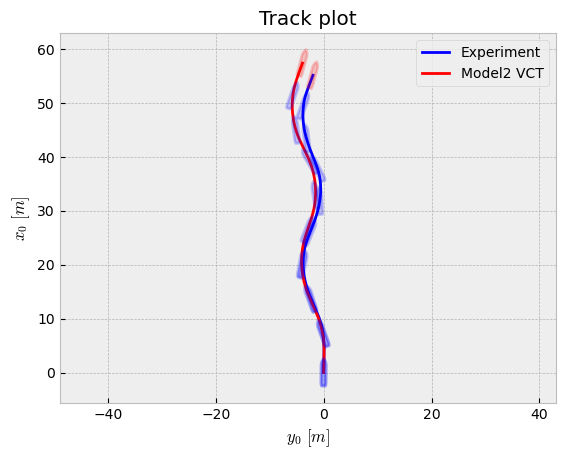

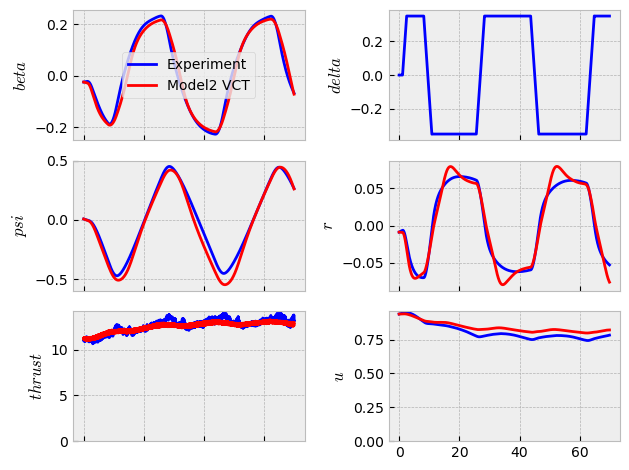

In [751]:
dataframes = {
              'Experiment':data,
              #'Model VCT':result,
              'Model2 VCT':result3,
             }
ax = track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B'], N=10)
plot(dataframes, keys=['u','beta','r','thrust','psi','delta']);

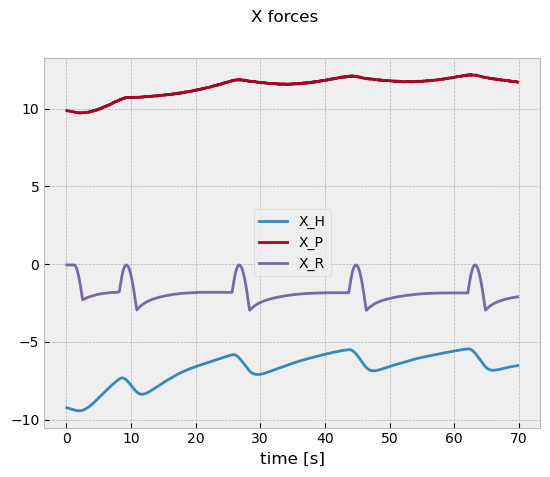

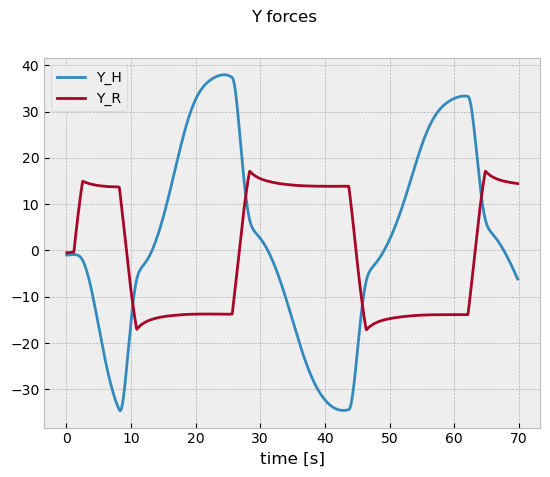

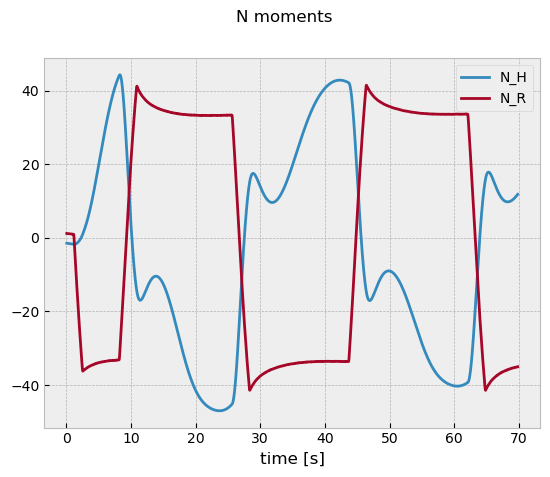

In [752]:
plot_force_components(model=model2, data=data)

## Save model

In [753]:
model_loaders["VCT_MDL_resistance"] = model2
catalog.save(f"{ship}.models",model_loaders)

[07/06/23 15:17:02] INFO     Saving data to 'wPCC.models' (PartitionedDataSet)...               ]8;id=65282;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=656566;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#382\382]8;;\

## Add wind

In [754]:
wind_data_HMD = pd.read_csv("HMD_PCTC.wind_data.csv", index_col=0)
wind_data_HMD.rename(columns={column:column.lower().replace(' ','') for column in wind_data_HMD.columns}, inplace=True)
wind_data_HMD.index=360-wind_data_HMD.index
wind_data_HMD.index = np.deg2rad(wind_data_HMD.index)
wind_data_HMD.index = np.mod(wind_data_HMD.index + np.pi, 2 * np.pi) - np.pi
wind_data_HMD['awa'] = wind_data_HMD.index
wind_data_HMD.index.name = "awa [rad]"
wind_data_HMD.sort_index(inplace=True)

In [755]:
from vessel_manoeuvring_models.models.wind_force import eq_C_x, eq_C_y, eq_C_n, C_x, C_y, C_n

In [756]:
eq_to_matrix_C_x = DiffEqToMatrix(eq_C_x, label=C_x, base_features=[awa])
eq_to_matrix_C_y = DiffEqToMatrix(eq_C_y, label=C_y, base_features=[awa])
eq_to_matrix_C_n = DiffEqToMatrix(eq_C_n, label=C_n, base_features=[awa])

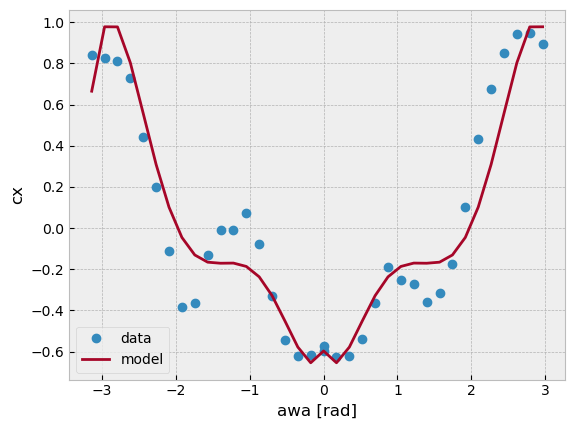

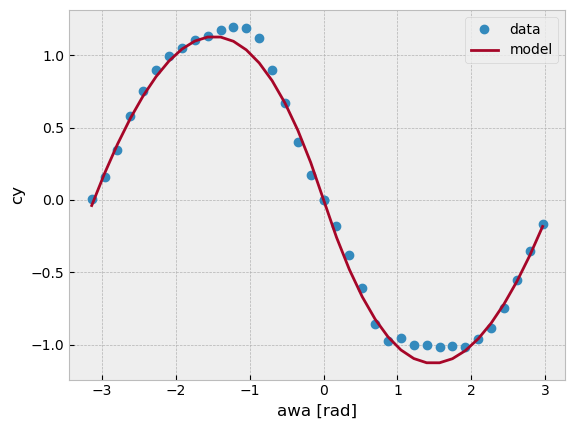

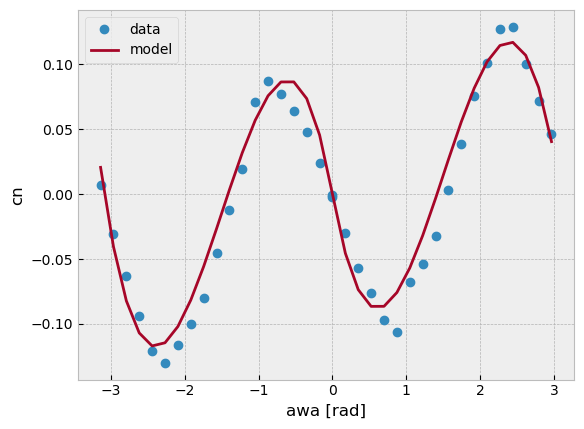

In [757]:
params_wind = {}
for key,eq_to_matrix in zip(['cx','cy','cn'], [eq_to_matrix_C_x, eq_to_matrix_C_y, eq_to_matrix_C_n]):

    X,y = eq_to_matrix.calculate_features_and_label(data=wind_data_HMD, y=wind_data_HMD[key], simplify_names=False)
    ols = sm.OLS(y,X, hasconst=False)
    ols_fit = ols.fit()
    params_wind.update(ols_fit.params)
    
    fig,ax=plt.subplots()
    y.plot(ax=ax,style='o', label='data')
    y_pred = ols_fit.predict(X)
    y_pred.plot(ax=ax, label='model')
    ax.set_ylabel(key)
    ax.legend()
    
params_wind = {key:value/2 for key,value in params_wind.items()}  # Note

## Rebuild ship model

In [795]:
def function_eq(eq):
    return sp.Eq(sp.Function(eq.lhs)(*list(eq.rhs.free_symbols)),eq.rhs)        

In [796]:
function_eq(wind_force.equations['X_W'])

Eq(X_W(C_x4, rho_A, C_x5, A_XV, C_x3, awa, C_x1, aws, C_x2, C_x0), A_XV*C_x0*aws**2*rho_A + A_XV*C_x1*aws**2*rho_A*Abs(awa) + A_XV*C_x2*awa**2*aws**2*rho_A + A_XV*C_x3*awa**2*aws**2*rho_A*Abs(awa) + A_XV*C_x4*awa**4*aws**2*rho_A + A_XV*C_x5*awa**4*aws**2*rho_A*Abs(awa))

In [759]:
wind_force = WindForceSystem(ship=model2, create_jacobians=False)

In [760]:
function_eq(wind_force.equations['X_W']).lhs

X_W(C_x4, rho_A, C_x5, A_XV, C_x3, awa, C_x1, aws, C_x2, C_x0)

In [761]:
X_eq = sp.Eq(model2.X_eq.lhs, model2.X_eq.rhs + function_eq(wind_force.equations['X_W']).lhs)
Y_eq = sp.Eq(model2.Y_eq.lhs, model2.Y_eq.rhs + function_eq(wind_force.equations['Y_W']).lhs)
N_eq = sp.Eq(model2.N_eq.lhs, model2.N_eq.rhs + function_eq(wind_force.equations['N_W']).lhs)

In [762]:
ship_data_7m = catalog.load(f"7m.ship_data")
ship_data['A_XV'] = ship_data_7m['A_XV']*ship_data_7m['scale_factor']**2/(ship_data['scale_factor']**2)
ship_data['A_YV'] = ship_data_7m['A_YV']*ship_data_7m['scale_factor']**2/(ship_data['scale_factor']**2)
ship_data['rho_A'] = ship_data_7m['rho_A']

[07/06/23 15:17:06] INFO     Loading data from '7m.ship_data' (YAMLDataSet)...                  ]8;id=421023;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=430551;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

In [763]:
parameters = model2.parameters.copy()
parameters.update(params_wind)
ship_parameters = model2.ship_parameters.copy()
ship_parameters.update(ship_data)

In [764]:
model_wind = model2.copy()
model_wind.__init__(X_eq=X_eq, Y_eq=Y_eq, N_eq=N_eq, 
                    parameters=parameters, 
                    ship_parameters=ship_parameters, 
                    control_keys=['delta','rev','twa','tws'], # NOTE! 
                    do_create_jacobian=False)
model_wind.subsystems

{'hull': <vessel_manoeuvring_models.models.subsystem.PrimeEquationSubSystem at 0x7fc2f6791fc0>,
 'propellers': <vessel_manoeuvring_models.models.subsystem.EquationSubSystem at 0x7fc30cc45f30>,
 'rudders': <vessel_manoeuvring_models.models.semiempirical_rudder.SemiempiricalRudderSystem at 0x7fc2f6791150>}

In [765]:
model_wind.subsystems['wind_force'] = wind_force.copy_and_refer_other_ship(ship=model_wind)

## Save wPCC wind model

In [766]:
model_loaders["VCT_MDL_resistance_wind"] = model_wind
catalog.save(f"{ship}.models",model_loaders)

[07/06/23 15:17:09] INFO     Saving data to 'wPCC.models' (PartitionedDataSet)...               ]8;id=858346;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=86073;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#382\382]8;;\

In [767]:
data['twa'] = 0
data['tws'] = 0
result_wind = model_wind.simulate(data)

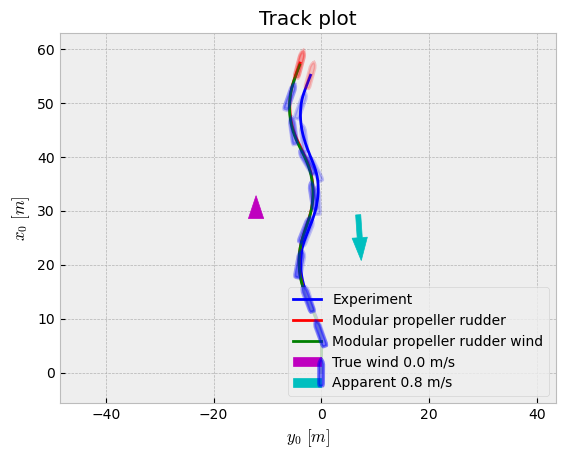

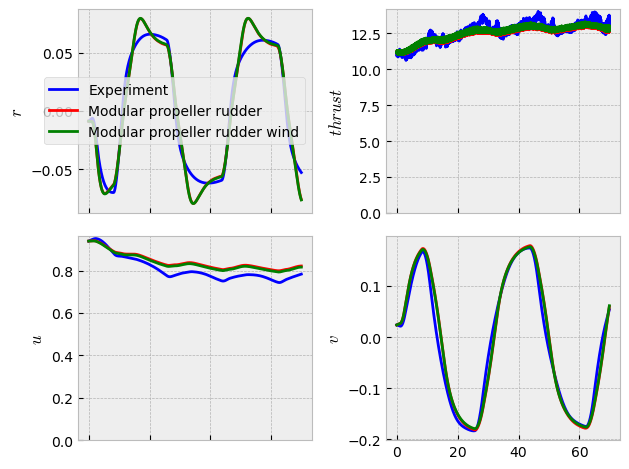

In [768]:
dataframes = {
              'Experiment':data,
              'Modular propeller rudder':result3,
              'Modular propeller rudder wind':result_wind,
             }
ax = track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B'], N=10)
plot(dataframes, keys=['u','v','r','thrust']);

## Also create a 7m model

In [769]:
ship_data_7m

{'T': 0.284,
 'L': 7.0,
 'B': 1.3,
 'rho': 1025,
 'x_G': -0.3266666666666667,
 'm': 1155,
 'I_z': 3386.0314842592607,
 'volume': 1.063551724137931,
 'CB': 0.41152752056103203,
 'x_r': -3.3168459992407717,
 'scale_factor': 30,
 'TWIN': 1,
 'D': 0.17,
 'A_XV': 1.12,
 'A_YV': 6.037,
 'rho_A': 1.225,
 'n_prop': 2}

In [770]:
ship_data

{'T': 0.2063106796116504,
 'L': 5.014563106796117,
 'CB': 0.45034232324249973,
 'B': 0.9466019417475728,
 'rho': 1000,
 'x_G': 0,
 'm': 441.0267843660858,
 'I_z': 693.124396594905,
 'volume': 0.4410267843660858,
 'scale_factor': 41.2,
 'x_r': -2.42219908951329,
 'TWIN': 1,
 'x_p': -2.42219908951329,
 'D': 0.12135922330097086,
 'w_p0': 0.151,
 'n_prop': 2,
 'tdf': 0.117,
 'A_XV': 0.5938354227542653,
 'A_YV': 3.2008789706852667,
 'rho_A': 1.225}

In [771]:
scale_7 = ship_data_7m['scale_factor']
scale_5 = ship_data['scale_factor']
scaling = scale_5/scale_7 
ship_parameters_7m = ship_data_7m.copy()
ship_parameters_7m['r_0']=ship_parameters_7m['D']/2
ship_parameters_7m['w_f']=ship_data['w_p0']

ship_parameters_7m['x']=ship_parameters['x']*scaling
ship_parameters_7m['A_R']=ship_parameters['A_R']*(scale_5**2)/(scale_7**2)
ship_parameters_7m['b_R']=ship_parameters['b_R']*scaling
ship_parameters_7m['x_p']=ship_parameters['x_p']*scaling
ship_parameters_7m['x_R']=ship_parameters['x_R']*scaling
ship_parameters_7m['y_R']=ship_parameters['y_R']*scaling

In [772]:
model_wind_7m = model_wind.copy()
model_wind_7m.set_ship_parameters(ship_parameters_7m)

In [776]:
model_7m = model2.copy()
model_7m.set_ship_parameters(ship_parameters_7m)

## Save model

In [777]:
model_loader_7m = catalog.load(f"7m.models")
model_loader_7m["VCT_MDL_resistance_wind"] = model_wind_7m
model_loader_7m["VCT_MDL_resistance"] = model_7m

catalog.save(f"7m.models",model_loader_7m)

[07/06/23 15:25:00] INFO     Loading data from '7m.models' (PartitionedDataSet)...              ]8;id=837804;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=815071;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Saving data to '7m.models' (PartitionedDataSet)...                 ]8;id=683162;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=449904;file:///home/maa/anaconda3/envs/phd/lib/python3.10/site-packages/kedro/io/data_catalog.py#382\382]8;;\

In [774]:
result_wind_7m = model_wind_7m.simulate(data)

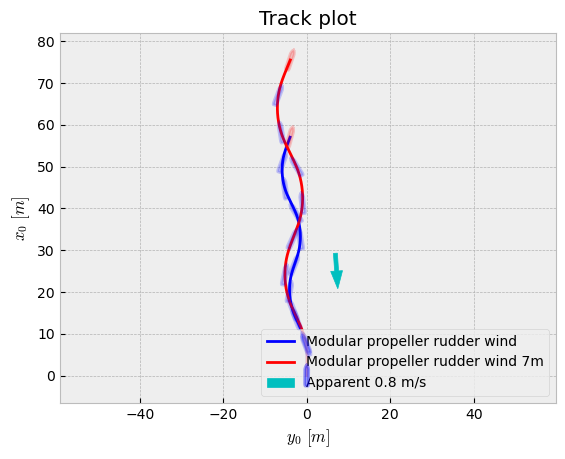

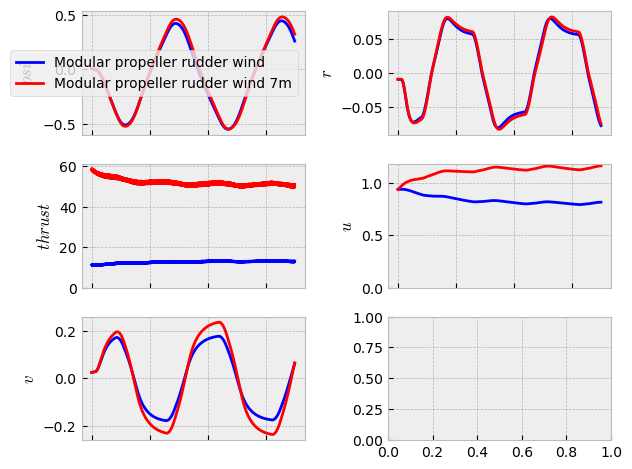

In [775]:
dataframes = {
              'Modular propeller rudder wind':result_wind,
              'Modular propeller rudder wind 7m':result_wind_7m,
             }
ax = track_plots(dataframes=dataframes, lpp=ship_data['L'], beam=ship_data['B'], N=10)
plot(dataframes, keys=['u','v','r','thrust','psi']);